## Feature Imputation Method Tests

In [1]:
import os
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

os.getcwd()

'/home/rc/capstone/notebooks/data-cleaning'

In [ ]:
# Checking env/venv dependencies
%pip install seaborn
import seaborn as sns; print("seaborn", sns.__version__)

In [2]:
# knn imputation ahs data
os.chdir('../../out')
!ls

district_knn.csv  state_knn.csv


In [3]:
# Load districtwise dataset
df = pd.read_csv('district_knn.csv')

# Remove all letter prefixes eg AA_ - ZZ_ from feature columns
df.columns = [re.sub(r'^[A-Z]{2}_', '', col) for col in df.columns]

# Check all features in resulting dataframe
df.head(10) # 284 districts surveyed

,State_Name,State_District_Name,Sample_Units_Total,Sample_Units_Rural,Sample_Units_Urban,Households_Total,Households_Rural,Households_Urban,Population_Total,Population_Rural,...,Under_Five_Mortality_Rate_U5MR_Rural_Lower_Limit_was_missing,Under_Five_Mortality_Rate_U5MR_Rural_Upper_Limit_was_missing,Under_Five_Mortality_Rate_U5MR_Urban_Lower_Limit_was_missing,Under_Five_Mortality_Rate_U5MR_Urban_Upper_Limit_was_missing,Sex_Ratio_At_Birth_Total_Lower_Limit_was_missing,Sex_Ratio_At_Birth_Total_Upper_Limit_was_missing,Sex_Ratio_At_Birth_Rural_Lower_Limit_was_missing,Sex_Ratio_At_Birth_Rural_Upper_Limit_was_missing,Sex_Ratio_At_Birth_Urban_Lower_Limit_was_missing,Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing
0,Assam,Barpeta,53,47,6,13711,12765,946,64606,60293,...,0,0,1,1,0,0,0,0,0,0
1,Assam,Bongaigaon,89,73,16,17384,14904,2480,84012,73899,...,0,0,1,1,0,0,0,0,0,0
2,Assam,Cachar,105,84,21,27488,24207,3281,127158,112171,...,0,0,0,0,0,0,0,0,0,0
3,Assam,Darrang,26,24,2,5951,5769,182,29048,28256,...,0,0,1,1,0,0,0,0,1,1
4,Assam,Dhemaji,121,108,13,14481,12619,1862,75451,66537,...,0,0,0,0,0,0,0,0,0,0
5,Assam,Dhubri,42,35,7,11001,9954,1047,50992,46337,...,0,0,1,1,0,0,0,0,0,0
6,Assam,Dibrugarh,91,66,25,21378,16514,4864,97268,76433,...,0,0,0,0,0,0,0,0,0,0
7,Assam,Goalpara,64,56,8,15891,14630,1261,75890,70273,...,0,0,1,1,0,0,0,0,0,0
8,Assam,Golaghat,70,61,9,16021,14183,1838,72165,64579,...,0,0,1,1,0,0,0,0,0,0
9,Assam,Hailakandi,10,8,2,2802,2381,421,13892,11986,...,0,0,1,1,0,0,0,0,0,0


In [4]:
df.shape

(284, 1286)

In [ ]:
# List of all feature columns
print(df.columns.tolist())

In [5]:
df.describe()

,Sample_Units_Total,Sample_Units_Rural,Sample_Units_Urban,Households_Total,Households_Rural,Households_Urban,Population_Total,Population_Rural,Population_Urban,Ever_Married_Women_Aged_15_49_Years_Total,...,Under_Five_Mortality_Rate_U5MR_Rural_Lower_Limit_was_missing,Under_Five_Mortality_Rate_U5MR_Rural_Upper_Limit_was_missing,Under_Five_Mortality_Rate_U5MR_Urban_Lower_Limit_was_missing,Under_Five_Mortality_Rate_U5MR_Urban_Upper_Limit_was_missing,Sex_Ratio_At_Birth_Total_Lower_Limit_was_missing,Sex_Ratio_At_Birth_Total_Upper_Limit_was_missing,Sex_Ratio_At_Birth_Rural_Lower_Limit_was_missing,Sex_Ratio_At_Birth_Rural_Upper_Limit_was_missing,Sex_Ratio_At_Birth_Urban_Lower_Limit_was_missing,Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing
count,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,...,284.0,284.0,284.000000,284.000000,284.0,284.0,284.0,284.0,284.000000,284.000000
mean,72.862676,53.971831,18.890845,15201.264085,12329.848592,2871.415493,74178.753521,60517.820423,13660.933099,14012.871268,...,0.0,0.0,0.274648,0.274648,0.0,0.0,0.0,0.0,0.031690,0.031690
std,49.310713,37.870795,24.083454,8360.819705,6621.757700,3900.137566,38613.108658,31475.272720,17693.167257,7395.232081,...,0.0,0.0,0.447125,0.447125,0.0,0.0,0.0,0.0,0.175483,0.175483
min,10.000000,8.000000,2.000000,2802.000000,2381.000000,153.000000,13892.000000,11722.000000,759.000000,2501.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000
25%,46.000000,34.000000,7.000000,9971.500000,7997.750000,971.000000,49222.500000,40206.500000,4613.000000,9229.250000,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000
50%,60.000000,45.000000,12.000000,13011.500000,10758.500000,1580.500000,65206.500000,53656.000000,7785.500000,12368.500000,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000
75%,82.000000,61.000000,20.000000,17749.000000,15250.000000,3044.250000,88998.500000,73290.000000,14757.500000,16442.750000,...,0.0,0.0,1.000000,1.000000,0.0,0.0,0.0,0.0,0.000000,0.000000
max,386.000000,337.000000,234.000000,66535.000000,47183.000000,35763.000000,303009.000000,238744.000000,155980.000000,56581.000000,...,0.0,0.0,1.000000,1.000000,0.0,0.0,0.0,0.0,1.000000,1.000000


In [6]:
df.shape

(284, 1286)

In [ ]:
districts = list(df.State_District_Name.unique())
print(len(districts))
districts

In [8]:
# Check for null values
# Null count per feature (overall)
null_counts = df.isnull().sum()

print("Null counts across all features:")
print(null_counts[null_counts > 0].sum()) 

Null counts across all features:
568


In [9]:
nulls_long = (
    df.drop(columns=["State_District_Name"])
      .isnull()
      .groupby(df["State_District_Name"])
      .sum()
      .reset_index()
      .melt(id_vars="State_District_Name", var_name="Feature", value_name="Null_Count")
)

print(nulls_long.head(20)) # First 20 of 640+ features

   State_District_Name     Feature  Null_Count
0                 Agra  State_Name           0
1                Ajmer  State_Name           0
2              Aligarh  State_Name           0
3            Allahabad  State_Name           0
4               Almora  State_Name           0
5                Alwar  State_Name           0
6       Ambedkar Nagar  State_Name           0
7               Anugul  State_Name           0
8               Araria  State_Name           0
9              Auraiya  State_Name           0
10          Aurangabad  State_Name           0
11            Azamgarh  State_Name           0
12           Bageshwar  State_Name           0
13             Baghpat  State_Name           0
14            Bahraich  State_Name           0
15            Balaghat  State_Name           0
16            Balangir  State_Name           0
17           Baleshwar  State_Name           0
18              Ballia  State_Name           0
19           Balrampur  State_Name           0


In [10]:
print(nulls_long.tail(20)) # Last 20 of 640+ features

       State_District_Name                                           Feature  \
364920           Sonbhadra  Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing   
364921            Sonitpur  Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing   
364922           Sultanpur  Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing   
364923          Sundargarh  Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing   
364924              Supaul  Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing   
364925             Surguja  Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing   
364926       Tehri Garhwal  Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing   
364927           Tikamgarh  Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing   
364928            Tinsukia  Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing   
364929                Tonk  Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing   
364930             Udaipur  Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing   
364931   Udham Singh Nagar  Sex_Ratio_At

In [11]:
# Auto-populate list of all features
features_df = pd.DataFrame({"Feature": df.columns})
print(features_df.head(20))

                                           Feature
0                                       State_Name
1                              State_District_Name
2                               Sample_Units_Total
3                               Sample_Units_Rural
4                               Sample_Units_Urban
5                                 Households_Total
6                                 Households_Rural
7                                 Households_Urban
8                                 Population_Total
9                                 Population_Rural
10                                Population_Urban
11       Ever_Married_Women_Aged_15_49_Years_Total
12       Ever_Married_Women_Aged_15_49_Years_Rural
13       Ever_Married_Women_Aged_15_49_Years_Urban
14  Currently_Married_Women_Aged_15_49_Years_Total
15  Currently_Married_Women_Aged_15_49_Years_Rural
16  Currently_Married_Women_Aged_15_49_Years_Urban
17                     Children_12_23_Months_Total
18                     Children

In [12]:
 ## Range of the target variable
print(df.Infant_Mortality_Rate_Imr_Total_Person.min())
print(df.Infant_Mortality_Rate_Imr_Total_Person.max())

19.22
97.0


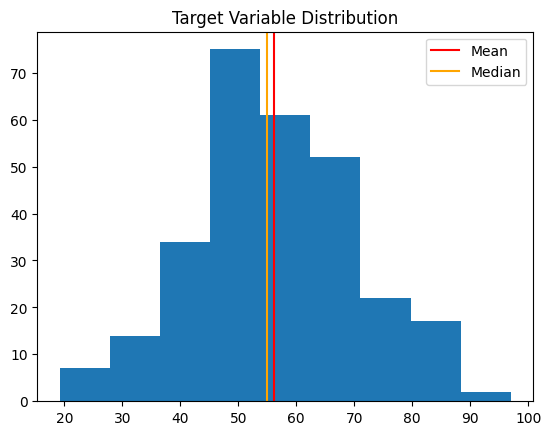

In [13]:
## Target Variable Distribution
plt.hist(df.Infant_Mortality_Rate_Imr_Total_Person, bins=9)
plt.axvline(df.Infant_Mortality_Rate_Imr_Total_Person.mean(), color='red', label='Mean')
plt.axvline(df.Infant_Mortality_Rate_Imr_Total_Person.median(), color='orange', label = 'Median')
plt.title('Target Variable Distribution'), plt.legend()
plt.show()

In [14]:
## Correlation overview
df.select_dtypes(include='number').corr()

,Sample_Units_Total,Sample_Units_Rural,Sample_Units_Urban,Households_Total,Households_Rural,Households_Urban,Population_Total,Population_Rural,Population_Urban,Ever_Married_Women_Aged_15_49_Years_Total,...,Under_Five_Mortality_Rate_U5MR_Rural_Lower_Limit_was_missing,Under_Five_Mortality_Rate_U5MR_Rural_Upper_Limit_was_missing,Under_Five_Mortality_Rate_U5MR_Urban_Lower_Limit_was_missing,Under_Five_Mortality_Rate_U5MR_Urban_Upper_Limit_was_missing,Sex_Ratio_At_Birth_Total_Lower_Limit_was_missing,Sex_Ratio_At_Birth_Total_Upper_Limit_was_missing,Sex_Ratio_At_Birth_Rural_Lower_Limit_was_missing,Sex_Ratio_At_Birth_Rural_Upper_Limit_was_missing,Sex_Ratio_At_Birth_Urban_Lower_Limit_was_missing,Sex_Ratio_At_Birth_Urban_Upper_Limit_was_missing
Sample_Units_Total,1.000000,0.879744,0.664112,0.915218,0.794245,0.613484,0.872806,0.737195,0.593355,0.894308,...,NaN,NaN,-0.178103,-0.178103,NaN,NaN,NaN,NaN,-0.038289,-0.038289
Sample_Units_Rural,0.879744,1.000000,0.228788,0.784546,0.879880,0.187966,0.741014,0.818504,0.161093,0.759552,...,NaN,NaN,-0.032096,-0.032096,NaN,NaN,NaN,NaN,0.023530,0.023530
Sample_Units_Urban,0.664112,0.228788,1.000000,0.640218,0.242616,0.960531,0.621832,0.222319,0.961576,0.636709,...,NaN,NaN,-0.314195,-0.314195,NaN,NaN,NaN,NaN,-0.115397,-0.115397
Households_Total,0.915218,0.784546,0.640218,1.000000,0.889939,0.632763,0.975385,0.853393,0.610511,0.983661,...,NaN,NaN,-0.142253,-0.142253,NaN,NaN,NaN,NaN,-0.038861,-0.038861
Households_Rural,0.794245,0.879880,0.242616,0.889939,1.000000,0.209956,0.877945,0.972468,0.186031,0.878744,...,NaN,NaN,0.002483,0.002483,NaN,NaN,NaN,NaN,0.020421,0.020421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sex_Ratio_At_Birth_Total_Upper_Limit_was_missing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sex_Ratio_At_Birth_Rural_Lower_Limit_was_missing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sex_Ratio_At_Birth_Rural_Upper_Limit_was_missing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sex_Ratio_At_Birth_Urban_Lower_Limit_was_missing,-0.038289,0.023530,-0.115397,-0.038861,0.020421,-0.117977,-0.062225,-0.006070,-0.124999,-0.056804,...,NaN,NaN,0.203926,0.203926,NaN,NaN,NaN,NaN,1.000000,1.000000


In [ ]:
# Ordered correlation with target var
target_corr = dict(df.select_dtypes(include='number').corr()['Infant_Mortality_Rate_Imr_Total_Person'])
sorted(target_corr.items(), key = lambda item: item[1])

In [16]:
# Columns representing totals
col_totals=[]
for c in df.columns:
    if 'Total' in c:
        col_totals.append(c)
col_totals

['Sample_Units_Total',
 'Households_Total',
 'Population_Total',
 'Ever_Married_Women_Aged_15_49_Years_Total',
 'Currently_Married_Women_Aged_15_49_Years_Total',
 'Children_12_23_Months_Total',
 'Average_Household_Size_Sc_Total',
 'Average_Household_Size_St_Total',
 'Average_Household_Size_All_Total',
 'Population_Below_Age_15_Years_Total',
 'Dependency_Ratio_Total',
 'Currently_Married_Illiterate_Women_Aged_15_49_Years_Total',
 'Sex_Ratio_At_Birth_Total',
 'Sex_Ratio_0_4_Years_Total',
 'Sex_Ratio_All_Ages_Total',
 'Person_Total',
 'Male_Total',
 'Female_Total',
 'Marriages_Among_Females_Below_Legal_Age_18_Years_Total',
 'Marriages_Among_Males_Below_Legal_Age_21_Years_Total',
 'Currently_Married_Women_Aged_20_24_Years_Married_Before_Legal_Age_18_Years_Total',
 'Currently_Married_Men_Aged_25_29_Years_Married_Before_Legal_Age_21_Years_Total',
 'Mean_Age_At_Marriage_Male_Total',
 'Mean_Age_At_Marriage_Female_Total',
 'Children_Currently_Attending_School_Age_6_17_Years_Person_Total',
 'Chi

In [17]:
def nullcount(df):
    nullcounts={}
    for col in df:
        nullcounts[col] = df[col].isnull().sum()
    return nullcounts

In [18]:
## Null values for each feature with nulls
null_counts = nullcount(df)
has_null = dict()
for k,v in null_counts.items():
    if v>0:
        has_null[k]=v
sorted(has_null.items(), key = lambda item: item[1])

[('Total_Fertility_Rate_Rural', np.int64(284)),
 ('Total_Fertility_Rate_Urban', np.int64(284))]

In [19]:
## Number of features with nulls
len(has_null)

2

### Correlation to Target Variable

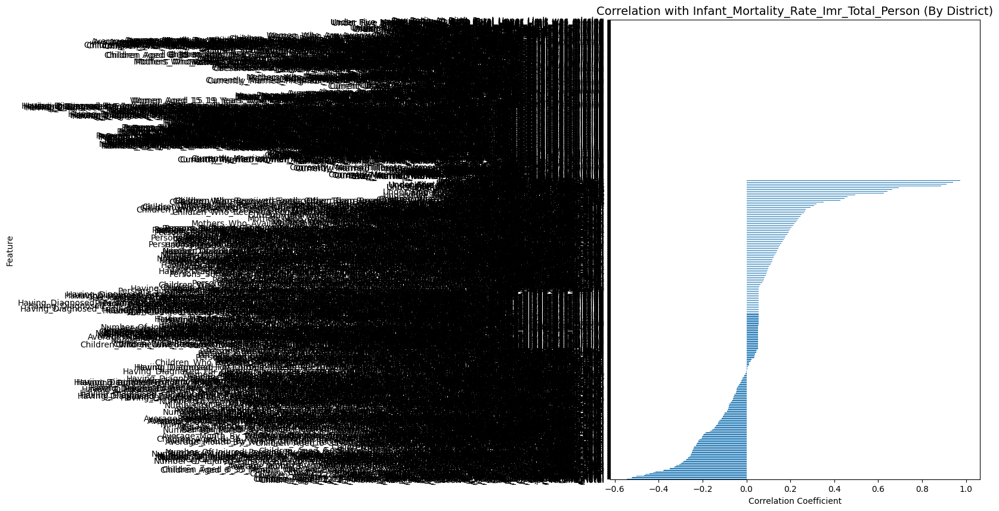

In [20]:
import matplotlib.pyplot as plt

# Get correlations with target
target = 'Infant_Mortality_Rate_Imr_Total_Person'
corr = (
    df.select_dtypes(include='number')
      .corr()[target]
      .drop(target)  # drop self-correlation
      .sort_values()
)

# Plot
plt.figure(figsize=(8, 10))
corr.plot(kind='barh')
plt.title(f'Correlation with {target} (By District)', fontsize=14)
plt.xlabel('Correlation Coefficient')
plt.ylabel('Feature')
plt.show()

In [21]:
# Correlation to target variable by district
plt.figure(figsize=(6, len(corr)/3))
sns.heatmap(corr.to_frame(), annot=True, cmap='coolwarm', center=0)
plt.title(f'Correlation with {target} (By District)', fontsize=14)
plt.show()